# Developping the python Class for joining dataset. 

This includes a basic utils functions for preprocessing of the data and the attribution class.

In [12]:
import warnings
warnings.filterwarnings('ignore') 

from typing import List, Dict, Tuple, Set, Optional, Callable
import geopandas as gpd
import dask_geopandas as dgpd
import warnings
import pandas as pd
import dask.dataframe as dd
import numpy as np
from datetime import datetime, timedelta


#write a function that verify if the input is a valid GeoDataFrame, meaning that it has a geometry column, a definied crs and a non-empty geometry column, a 'class' column (string) and a valid index column (int) and two datetimes
def is_dataset_valid(name: str, dataset: gpd.GeoDataFrame, ref=False) -> bool:
    assert isinstance(dataset, gpd.GeoDataFrame), f"dataset '{name}' is not a GeoDataFrame"
    assert 'geometry' in dataset.columns, f"dataset '{name}' has no geometry column"
    assert dataset.crs is not None, f"dataset '{name}' has no crs"
    assert dataset.index.dtype == int, f"dataset '{name}' has no valid index column"
    if not ref:
        assert 'class' in dataset.columns, f"dataset '{name}' has no class column"
        dataset['class'] = dataset['class'].astype(str)

    #check if the 'start_date' and 'end_date' columns are present, if not check if a column 'year' is present
    if 'start_date' not in dataset.columns:
        assert 'year' in dataset.columns, f"dataset '{name}' has no start_date or year column"

        #if year in column, create a start_date and end_date column as the first and last day of this year
        dataset['start_date'] = pd.to_datetime(dataset['year'], format='%Y')
        dataset['end_date'] = pd.to_datetime(dataset['year'], format='%Y') + pd.offsets.YearEnd(0)
        


    assert 'start_date' in dataset.columns, f"dataset '{name}' has no start_date column"
    assert 'end_date' in dataset.columns, f"dataset '{name}' has no end_date column"
    dataset['start_date'] = pd.to_datetime(dataset['start_date'], format='%Y-%m-%d')
    dataset['end_date'] = pd.to_datetime(dataset['end_date'], format='%Y-%m-%d')
    dataset['dataset'] = name
    
    return dataset 

def get_subset_dataset(dataset: gpd.GeoDataFrame, start_year: datetime, end_year: datetime) -> gpd.GeoDataFrame:
    return dataset[(dataset['start_date'] <= end_year) & (dataset['end_date'] >= start_year)]

def classify_source_type(gdf : gpd.GeoDataFrame, area_threshold = 101) -> str:
    assert gdf.crs == 'epsg:2154', "crs is not epsg:2154"
    """area threshold should be viewed as the granularity level of the attribution"""
    
    areas = gdf.geometry.area / 1e6
    mean = np.mean(areas)
    std = np.std(areas)
    mi = np.min(areas)
    ma = np.max(areas)
    median = np.median(areas)
    p90 = np.percentile(areas, 90) #change to p95 
    # print(f"[in km2] - mean: {mean}, std: {std}, min: {mi}, max: {ma}, median: {median}, p90: {p90}")

    
    if  p90 >= area_threshold:
        alpha = np.sqrt(area_threshold) / np.sqrt((mean + 2 * std) / np.pi) #change to np.sqrt(area_threshold / np.pi)
        print(f'suggested value for alpha : {alpha :.2f}')
        return 'spatial_entity', alpha 
    else:
        alpha = None
        return 'point/polygon', alpha

def get_spatial_join(dataset: gpd.GeoDataFrame, reference: gpd.GeoDataFrame, t: str, spatial_buffer: int) -> gpd.GeoDataFrame:

    if t == 'point':
        return dataset.sjoin_nearest(reference.compute(), max_distance=spatial_buffer, distance_col='sd')
    
    elif t == 'polygon':
        return dataset.sjoin(reference)
    

class Attribution:
    #ddataset is a dict containing the name of the dataset and the GeoDataframe
    #reference is a GeoDataframe containing the reference data
    #doa is a dict containing the overall accuracy of each dataset 
    #dweights is a dict containing the weight function for each factor 

    #write the init method with typing
    def __init__(self, ddataset: Dict[str, gpd.GeoDataFrame], reference: gpd.GeoDataFrame, 
    doa: Dict[str, float], temporal_buffer: int, dsbuffer: Dict[str, int], dtypes: Dict[str, int], granularity: int = 10, 
    start_year: int = 2015, end_year: int = 2020):
        
        self.start_year = datetime(start_year, 1, 1)
        self.end_year = datetime(end_year, 12, 31)
        self.doa = doa
        self.temporal_buffer = temporal_buffer #years
        self.dsbuffer = dsbuffer #km 
        self.dtypes = dtypes
        self.mandatory_columns = ['start_date', 'end_date', 'class', 'dataset', 'year']
        self.granularity = granularity
        self.ddataset = ddataset
        self.dtypes_ = {}
        self.dalpha = {}
        for name, dataset in self.ddataset.items():
            self.ddataset[name] = get_subset_dataset(is_dataset_valid(name, dataset), self.start_year - timedelta(days = 365.25 * self.temporal_buffer), self.end_year + timedelta(days = 365.25 * self.temporal_buffer))
            t, alpha = classify_source_type(dataset, area_threshold=self.granularity ** 2 + 1) #change to np.pi * self.granularity ** 2  (model -> circle)
            self.dtypes_[name] = t
            self.dalpha[name] = alpha
        t, alpha = classify_source_type(reference, area_threshold=self.granularity ** 2 + 1) #change to np.pi * self.granularity ** 2  (model -> circle)
        self.dtypes_['reference'] = t
        
        self.reference = get_subset_dataset(is_dataset_valid('reference', reference, ref=True), self.start_year - timedelta(days = 365.25 * self.temporal_buffer), self.end_year + timedelta(days = 365.25 * self.temporal_buffer))
        self.optional_columns = self.get_optional_columns()

        assert self.ddataset.keys() == self.doa.keys(), "doa keys are not the same as ddataset keys"
        assert self.ddataset.keys() == self.dsbuffer.keys(), "dsbuffer keys are not the same as ddataset keys"
        assert self.ddataset.keys() == self.dtypes.keys(), "dtypes keys are not the same as ddataset keys"
        assert all([self.ddataset[name].crs == self.reference.crs for name in self.ddataset.keys()]), "not all the geodataframe have the same crs"

    def get_optional_columns(self) -> List[str]:
        cols = []
        for dataset in self.ddataset.values():
            cols.extend(dataset.columns.difference(self.mandatory_columns).values.tolist())

        optional_cols = []
        for col in list(set(cols)):
            if col in self.reference.columns and col != 'geometry':
                self.mandatory_columns.append(col)
            elif col != 'geometry':
                optional_cols.append(col)

        return optional_cols

    #write a method that returns the temporal and spatial join
    def get_spatial_joins(self, ddataset_year: Dict[str, dgpd.GeoDataFrame or gpd.GeoDataFrame], reference_year: dgpd.GeoDataFrame) -> gpd.GeoDataFrame:
        
        #SPATIAL JOIN ~ 10s
        dtsj = []
        for (name, dataset) in ddataset_year.items():
            t = self.dtypes[name]
            dtsj.append(get_spatial_join(dataset, reference_year, t, self.dsbuffer[name]))

        concat1 = dd.concat(dtsj, axis=0).compute()

        #CONCATENATION WITH REF ~ 1s
        col = ['geometry'] + [col + '_left' for col in self.mandatory_columns] + [col for col in self.optional_columns] + ['sd']
        all_index_right = concat1['index_right'].unique()
        concat1 = concat1[['index_right']+col]
        rename = {c: c.split('_left')[0] for c in col}
        concat1 = concat1.rename(columns=rename)
        reference_year['index_right'] = reference_year.index

        #order of reference and concat1 is important. If we want to use iloc[0] on the group to retrieve reference row, we have to stick to this order.
        concat2 = dd.concat([reference_year.loc[all_index_right], concat1], axis=0).compute()

        #MERGING ~ 1s 
        merge = pd.merge(concat2, reference_year.compute(), left_on='index_right', right_index=True)
        drop = ['geometry_y','index_right_y', 'index_right_x'] + [col + '_y' for col in self.mandatory_columns] 
        merge = merge.drop(columns=drop)
        rename = {c: c.split('_x')[0] for c in merge.columns} 
        rename.update({'index_right': 'index_reference'})
        return merge.rename(columns=rename).reset_index()


# Loading dataset

In [7]:
import geopandas as gpd

dfde = gpd.read_parquet('../data/processed_datasets/simplified_DFDE_1984_2021_EPSG2154_FR.parquet')
hm = gpd.read_parquet('../data/processed_datasets/simplified_health-monitoring_2007-2023_EPSG2154_FR.parquet')
nfi = gpd.read_parquet('../data/processed_datasets/simplified_NFI_2003-2021_EPSG2154_FR.parquet')
senfseidl = gpd.read_parquet("../data/processed_datasets/simplified_SenfSeidl_joined_EPSG2154_FR.parquet")
bdiff = gpd.read_parquet('../data/processed_datasets/simplified_bdiff_2012_2022_FR_EPSG2154.parquet')
# tcl = gpd.read_parquet('../data/processed_datasets/simplified_TreeCoverLoss_2001-2022_EPSG2154_FR.parquet')

In [8]:
#preprocessing bdiff:
bdiff['class'] = 'Fire'
bdiff = bdiff[ bdiff.forest_area_m2 > 5000 ]
#create function that convert column 'start_date' to pd.datetime with the following format : '%Y-%m-%d', 
# if the 'start_date' is just mentionning the time and not the date, use the year column to create a start_date and end_date column as the first and last day of this year
#create this function as 'to_datetime_safe', it takes as input a row of a dataframe
def to_datetime_safe(row):
    try :
        return pd.to_datetime(row['start_date'], format='%Y-%m-%d'), pd.to_datetime(row['start_date'], format='%Y-%m-%d')
    except ValueError:
        return pd.to_datetime(row['year'], format='%Y'), pd.to_datetime(row['year'], format='%Y') + pd.offsets.YearEnd(0)


bdiff[['start_date', 'end_date']] = bdiff.apply(to_datetime_safe, axis=1, result_type='expand')

In [9]:
#preprocessing tcl:
tcl = gpd.read_parquet('../data/processed_datasets/simplified_TreeCoverLoss_2001-2022_EPSG2154_FR.parquet')
tcl['year'] = tcl['year'] + 2000
tcl['class'] = None

In [13]:

temporal_buffer = 3 #change to 5

#subset of datasets
ddataset = {'dfde': dfde, 'hm': hm, 'nfi': nfi, 'senfseidl': senfseidl, 'bdiff': bdiff}


dtypes = {'dfde': 'polygon', 'hm': 'point', 'nfi': 'point', 'senfseidl': 'point', 'bdiff': 'polygon'}
doa = {'dfde': 0.95, 'hm': 1.0, 'nfi': 1.0, 'senfseidl': 0.88, 'bdiff': 1.0}
dsbuffer = {'dfde': None, 'hm': 5000, 'nfi': 7000, 'senfseidl': 100, 'bdiff': None}

attribution = Attribution(ddataset, reference=tcl, doa=doa, dtypes=dtypes, temporal_buffer=temporal_buffer, dsbuffer=dsbuffer, granularity=10)

suggested value for alpha : 0.06


In [18]:
#Temporal buffer 
import dask_geopandas as dgpd
year = 2015
ddataset_year = {}
for name, dataset in attribution.ddataset.items():
    t = attribution.dtypes[name]
    d = dataset[(dataset['start_date'].dt.year >= year - temporal_buffer) & (dataset['end_date'].dt.year <= year + temporal_buffer)]
    if t == 'point':
        ddataset_year[name] = d
    elif t == 'polygon':
        ddataset_year[name] = dgpd.from_geopandas(d, npartitions=10)

reference_year = attribution.reference[ attribution.reference['year'] == year ]
reference_year = dgpd.from_geopandas(reference_year, npartitions=10)


In [19]:
attribution_year = attribution.get_spatial_joins(ddataset_year, reference_year)


In [20]:
attribution_year.dataset.value_counts()

dataset
senfseidl    142096
reference     57627
bdiff         42512
hm             8703
dfde           3252
nfi             701
Name: count, dtype: int64[pyarrow]

# Visualisation

In [96]:
groups = attribution_year.groupby('index_reference')

from itertools import islice 

gr = []
for name, group in islice(groups, 0, 10000):
    gr.append(group)

In [97]:
a = [i for i,r in enumerate(gr) if len(r.dataset.unique()) > 3]

In [155]:
data = gr[a[3]]

dcustom_similarity_function = {'tree specie relatedness': (compute_tree_coherence, {}, 1.0), 'class relatedness': (compute_class_similarity, {'class_scores': dclass_score}, 1.0)}
get_cluster(data, dtypes_=attribution.dtypes_, dalpha=attribution.dalpha, dcustom_similarity_function=dcustom_similarity_function, threshold=0.)

,Similarity,Class,Start_Date,End_Date,index_reference
2,0.695808,biotic-mortality,2018-01-01,2018-12-31,1145340
1,0.629743,biotic-dieback,2017-01-01,2018-12-31,1145340
0,0.582435,biotic-dieback,2020-01-01,2020-12-31,1145340


In [156]:
data

,index,index_reference,geometry,year,tree_type,essence,class,start_date,end_date,dataset,cause,name,forest_area_m2,notes,intensity,area,sd,labels
9544,1145340,1145340,"POLYGON ((817702.284 6980741.918, 817702.861 6...",2018.0,Mixed,"fir, spruce,broadleaf",<NA>,2018-01-01,2018-12-31,reference,<NA>,<NA>,NaN,<NA>,NaN,NaN,NaN,2
9545,16631,1145340,"POLYGON ((813824.945 6978551.768, 813829.342 6...",2020.0,Mixed,"broadleaf,fir, spruce,mixed,deciduous oaks,con...",Fire,2020-01-01,2020-12-31,bdiff,<NA>,"Les Mazures, Charleville-Mézières, Ardennes, G...",20000.0,<NA>,NaN,NaN,NaN,0
9546,43359,1145340,POINT (819273.432 6981135.037),2018.0,conifer,Spruces,Biotic,2018-01-01,2018-12-31,hm,Typographe,<NA>,NaN,"Sur les 600 ha de résineux, 168 ha sont concer...",NaN,NaN,1288.574738,2
9547,68993,1145340,"POLYGON ((818046.042 6980725.060, 818048.826 6...",2018.0,Conifer,"fir, spruce",Other,2018-01-01,2018-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,0.000000,1
9548,1660407,1145340,"POLYGON ((817669.867 6979905.850, 817639.964 6...",2017.0,Mixed,"fir, spruce,broadleaf",Other,2017-01-01,2017-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,0.000000,1
9549,1660409,1145340,"POLYGON ((817439.619 6980758.463, 817469.522 6...",2017.0,Mixed,"fir, spruce,broadleaf",Other,2017-01-01,2017-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,0.000000,1
9550,2160264,1145340,"POLYGON ((818040.474 6980784.831, 818100.282 6...",2020.0,Conifer,"fir, spruce",Other,2020-01-01,2020-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,1.730342,0
9551,2160265,1145340,"POLYGON ((817986.235 6980719.435, 817926.428 6...",2020.0,Conifer,"fir, spruce",Other,2020-01-01,2020-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,0.000000,0
9552,2160266,1145340,"POLYGON ((817697.616 6980903.320, 817667.712 6...",2020.0,Mixed,"fir, spruce,broadleaf",Other,2020-01-01,2020-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,50.905123,0
9553,4837702,1145340,"POLYGON ((817662.144 6980960.278, 817692.048 6...",2020.0,Mixed,"fir, spruce,broadleaf","Storm,Biotic",2020-01-01,2020-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,50.905123,0


In [184]:
# 86343


try:
    data['start_date'] = data['start_date'].dt.strftime('%Y-%m-%d')
except :
    pass 

try:
    data['end_date'] = data['end_date'].dt.strftime('%Y-%m-%d')
except : 
    pass

data.explore(column = 'dataset', 
             tooltip = ['year', 'start_date', 'end_date', 'essence', 'class', 'notes'], 
             tiles = 'Esri.WorldImagery',
             marker_kwds=dict(radius=5, fill=True))

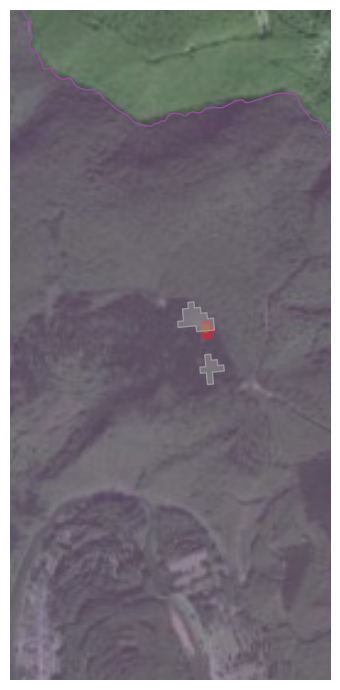

In [200]:
import matplotlib.pyplot as plt
import contextily as ctx
import pandas as pd
import geopandas as gpd

gdf = data.reset_index().fillna('None')
# Assuming your GeoDataFrame is named 'gdf'

# Convert dates to datetime if not already
gdf['start_date'] = pd.to_datetime(gdf['start_date'])
gdf['end_date'] = pd.to_datetime(gdf['end_date'])

# Create a color map
unique_sources = gdf['dataset'].unique()
colors = plt.cm.get_cmap('Set1', len(unique_sources))
source_color_map = dict(zip(unique_sources, colors(range(len(unique_sources)))))
dalpha = {
    'bdiff':0.25, 
    'dfde':0.25,
    'hm':1.,
    'nfi':1.,
    'reference':0.75,
    'senfseidl':0.5
}

# Begin plotting
fig, ax = plt.subplots(1, 1, figsize=(7, 7))

# Plot each source with its own color
for source, color in source_color_map.items():
    #convert color to RGBA
    facecolor = color.copy()
    facecolor[3] = dalpha[source]
    gdf[gdf['dataset'] == source].plot(ax=ax, facecolor=facecolor, legend=True, edgecolor=color, linewidth=1)

ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.Esri.WorldImagery, alpha=0.75, attribution=False)

# Set axis off
ax.set_axis_off()

#COMPUTE THE LIMITE OF THE PLOT AS THE BOUNDARY OF GDF WITHOUT THE ROW HAVING 'DFDE' OR 'BDIFF' as the dataset
gdf_ = gdf[~gdf['dataset'].isin(['dfde', 'bdiff'])]

#SET LIM OF THE PLOTS
ax.set_xlim((gdf_.total_bounds[0] * 0.75 + gdf.total_bounds[0] * 0.25), (gdf_.total_bounds[2] * 0.75 + gdf.total_bounds[2] * 0.25))
ax.set_ylim((gdf_.total_bounds[1] * 0.75 + gdf.total_bounds[1] * 0.25), (gdf_.total_bounds[3] * 0.75 + gdf.total_bounds[3] * 0.25))
plt.tight_layout()
plt.show()


# Group clasification

Computation of similiarity matrix in the followings spaces : 
- x
- y 
- start-date
- end-date
- tree-specie
- class

### Weights design

In [5]:
import numpy as np

def exponential_decay(days: int, half_life: int) -> float:
    return np.exp(-np.log(2) * days / half_life)

#spatial weights
def spatial_weight(x) -> float:
    if x <= 600:
        return 1
    else: 
        return exponential_decay(x - 600, 2900)
    
#temporal weights
def temporal_weight(x) -> float:
    return exponential_decay(x, 3*365)

def compute_dstar(area):
    return np.sqrt(area / np.pi)

Text(0.5, 0, 'm2')

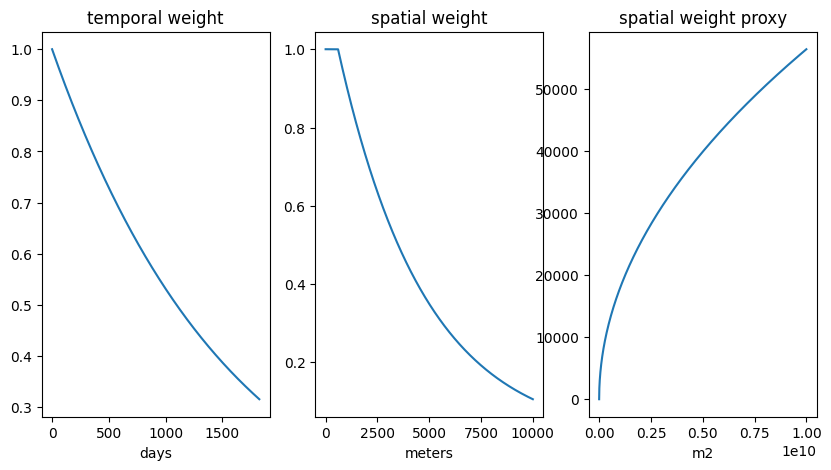

In [9]:
import matplotlib.pyplot as plt
import numpy as np 

fig, axes = plt.subplots(1, 3, figsize=(10, 5))

x = np.arange(0, 365*5)
y = [temporal_weight(i) for i in x]
axes[0].plot(x, y)
axes[0].set_title('temporal weight')
axes[0].set_xlabel('days')

x = np.arange(0, 10000)
y = [spatial_weight(i) for i in x]
axes[1].plot(x, y)
axes[1].set_title('spatial weight')
axes[1].set_xlabel('meters')

x = np.linspace(0, 10000 * 1e6, 1000)
y = [ compute_dstar(x) for x in x]
axes[2].plot(x, y)
axes[2].set_title('spatial weight proxy')
axes[2].set_xlabel('m2')

### Group similarity design

In [122]:
data

,index,index_reference,geometry,year,tree_type,essence,class,start_date,end_date,dataset,cause,name,forest_area_m2,notes,intensity,area,sd,labels
12637,1304105,1304105,"POLYGON ((840183.638 6947351.490, 840184.321 6...",2018.0,Conifer,conifers,<NA>,2018-01-01 00:00:00,2018-12-31,reference,<NA>,<NA>,NaN,<NA>,NaN,NaN,NaN,0
12638,62315,1304105,POINT (839773.643 6947100.553),2021.0,conifer,Larches,Biotic,2021-01-01 00:00:00,2021-12-31,hm,Scolytes (espèce indéterminée),<NA>,NaN,diamètre moyen 30 cm H > 25 m,NaN,NaN,406.423013,0
12639,90797,1304105,POINT (839143.040 6948306.234),NaN,Broadleaf,Hornbeam,Mortality,2015-12-28 18:00:00,2020-12-28,nfi,<NA>,<NA>,NaN,<NA>,1.0,NaN,1393.673778,1
12640,2047310,1304105,"POLYGON ((840087.125 6947345.526, 840266.481 6...",2019.0,Mixed,"broadleaf,conifers",Other,2019-01-01 00:00:00,2019-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,0.000000,0
12641,2047311,1304105,"POLYGON ((840296.373 6947365.132, 840386.051 6...",2019.0,Conifer,conifers,Other,2019-01-01 00:00:00,2019-12-31,senfseidl,<NA>,<NA>,NaN,<NA>,NaN,NaN,8.749646,0


In [22]:
dclass_score = {
    'senfseidl': {
        'Storm,Biotic': {'biotic-mortality':0.4, 'storm':0.4, 'biotic-dieback':0.2},
        'Fire' : {'fire':0.9, 'storm':0.05, 'biotic-mortality':0.05},
        'Other' : {'biotic-dieback':0.4, 'drought-dieback':0.2, 'anthropogenic':0.4}
    },
    'dfde': {
        'Biotic':{'biotic-mortality':0.25, 'biotic-dieback':0.75},
        'Storm':{'storm':1.},
        'Fire':{'fire':1.0},
        'Drought':{'drought-dieback':1.},
        'Other':{'anthropogenic':1.}
    },
    'nfi': {
        'Mortality':{'biotic-mortality':0.5, 'drought-dieback':0.25, 'biotic-dieback':0.25},
        'Storm':{'storm':1.},
        'Fire':{'fire':1.},
        'Other':{'anthropogenic':0.33, 'drought-dieback':0.33, 'biotic-dieback':0.33},
        'Anthropogenic':{'anthropogenic':1.} 
    },
    'hm': {
        'Biotic':{'biotic-mortality':0.5, 'biotic-dieback':0.5},
        'Storm':{'storm':1.},
        'Fire':{'fire':1.},
        'Drought-dieback':{'drought-dieback':1.},
        'Other':{'anthropogenic':1.},
    'bdiff': {
        'Fire':{'fire':1.}
    },}}

def calculate_similarity(row1, row2, class_scores):
    # If both classes are from the same dataset and have the same class, return 1.0
    if row1['dataset'] == row2['dataset'] and row1['class'] == row2['class']:
        return 1.0
    
    print(row1['dataset'], row1['class'], row2['dataset'], row2['class'])
    
    # Get the score dictionaries for the two classes
    scores1 = class_scores.get(row1['dataset'], {}).get(row1['class'], {})
    scores2 = class_scores.get(row2['dataset'], {}).get(row2['class'], {})
    
    # Find common final classes between the two classes
    common_final_classes = set(scores1.keys()).intersection(set(scores2.keys()))
    
    # Calculate the sum of the means of the scores for each common final class
    similarity_score = sum((scores1[final_class] + scores2[final_class]) / 2 for final_class in common_final_classes)
    
    return similarity_score

### Similarity matrix

group with dfde : 7015 

In [23]:
def calculate_iou(poly1, poly2):
    intersection = poly1.intersection(poly2).area
    union = poly1.union(poly2).area
    return intersection / union if union != 0 else 0

def calculate_d_star(area, alpha=1):
    return alpha * np.sqrt(area / np.pi)

def build_spatial_matrix(gdf: gpd.GeoDataFrame, dtypes_: Dict[str, str], dalpha: Dict[str, float], f: Callable) -> np.ndarray:
    num_elements = len(gdf)
    distance_matrix = np.zeros((num_elements, num_elements))

    if not any([dtypes_[name] == 'spatial_entity' for name in gdf.dataset.unique()]):
        # Calculate distances only for the upper triangle of the matrix
        for i in range(num_elements):
            for j in range(i + 1, num_elements):  # Start from i+1 to skip the diagonal
                # Calculate distance between points
                distance = gdf.geometry.iloc[i].centroid.distance(gdf.geometry.iloc[j].centroid)
                # Convert distance to similarity
                similarity = f(distance)
                distance_matrix[i][j] = similarity
                distance_matrix[j][i] = similarity  # Mirror the value

    else :
        # Calculate distances only for the upper triangle of the matrix
        for i in range(num_elements):
            for j in range(i + 1, num_elements):  # Start from i+1 to skip the diagonal
                d_i = gdf.iloc[i]['dataset']
                d_j = gdf.iloc[j]['dataset']
                t_i = dtypes_[d_i]
                t_j = dtypes_[d_j]

                if t_i == 'point/polygon' and t_j == 'point/polygon':
                    distance = gdf.geometry.iloc[i].centroid.distance(gdf.geometry.iloc[j].centroid)
                elif t_i == 'spatial_entity' and t_j == 'spatial_entity':
                    area_i = gdf.geometry.iloc[i].area
                    area_j = gdf.geometry.iloc[j].area
                    d_star_i = calculate_d_star(area_i, dalpha[d_i])
                    d_star_j = calculate_d_star(area_j, dalpha[d_j])
                    iou = calculate_iou(gdf.geometry.iloc[i], gdf.geometry.iloc[j])
                    distance = (d_star_i + d_star_j) / 2 / iou if iou > 0 else (d_star_i + d_star_j) / 2
                else:
                    if t_i == 'spatial_entity':
                        area_i = gdf.geometry.iloc[i].area
                        distance = calculate_d_star(area_i, dalpha[d_i])
                    else:
                        area_j = gdf.geometry.iloc[j].area
                        distance = calculate_d_star(area_j, dalpha[d_j])

                similarity = f(distance) ##
                distance_matrix[i][j] = similarity
                distance_matrix[j][i] = similarity

        # Fill the diagonal with the maximum similarity score, e.g., 1
    np.fill_diagonal(distance_matrix, 1)
    return distance_matrix

In [24]:
#import fuzz
from thefuzz import fuzz 
def compute_tree_coherence(row1, row2) -> float:

    for essence1 in row1['essence'].split(','):
        for essence2 in row2['essence'].split(','):
            if fuzz.token_set_ratio(essence1.lower(), essence2.lower()) > 80:
                return 1
        
    if row1['tree_type'].lower() == row2['tree_type'].lower():
        return 0.75 
    
    if row1['tree_type'].lower() == 'mixed' or row2['tree_type'].lower() == 'mixed':
        return 0.5

    return 0.25 

dclass_score = {
    'senfseidl': {
        'Storm,Biotic': {'biotic-mortality':0.45, 'storm':0.5, 'biotic-dieback':0.05},
        'Fire' : {'fire':0.9, 'storm':0.05, 'biotic-mortality':0.05},
        'Other' : {'biotic-dieback':0.4, 'drought-dieback':0.2, 'anthropogenic':0.4}
    },
    'dfde': {
        'Biotic':{'biotic-mortality':0.25, 'biotic-dieback':0.75},
        'Storm':{'storm':1.},
        'Fire':{'fire':1.0},
        'Drought':{'drought-dieback':1.},
        'Other':{'anthropogenic':1.}
    },
    'nfi': {
        'Mortality':{'biotic-mortality':0.5, 'drought-dieback':0.25, 'biotic-dieback':0.25},
        'Storm':{'storm':1.},
        'Fire':{'fire':1.},
        'Other':{'anthropogenic':0.33, 'drought-dieback':0.33, 'biotic-dieback':0.33},
        'Anthropogenic':{'anthropogenic':1.} 
    },
    'hm': {
        'Biotic':{'biotic-mortality':0.5, 'biotic-dieback':0.5},
        'Storm':{'storm':1.},
        'Fire':{'fire':1.},
        'Drought-dieback':{'drought-dieback':1.},
        'Other':{'anthropogenic':1.},
    },
    'bdiff': {
        'Fire':{'fire':1.}
    }}

def compute_class_similarity(row1, row2, dclass_score):
    # If both classes are from the same dataset and have the same class, return 1.0
    if row1['dataset'] == row2['dataset'] and row1['class'] == row2['class']:
        return 1.0

    # Get the score dictionaries for the two classes
    scores1 = dclass_score.get(row1['dataset'], {}).get(row1['class'], {})
    scores2 = dclass_score.get(row2['dataset'], {}).get(row2['class'], {})
    
    # Find common final classes between the two classes
    common_final_classes = set(scores1.keys()).intersection(set(scores2.keys()))
    
    # Calculate the sum of the means of the scores for each common final class
    similarity_score = sum((scores1[final_class] + scores2[final_class]) / 2 for final_class in common_final_classes)
    
    return similarity_score
    
# Function to build the similarity matrix
def build_custom_matrix(df : pd.DataFrame, custom_similarity_function : Callable, kwargs: dict) -> np.ndarray:
    n = len(df)
    # Initialize the similarity matrix with zeros
    similarity_matrix = np.zeros((n, n))
    
    # Iterate over each pair of rows
    for i in range(n):
        for j in range(i+1, n):  # Use range(i, n) to avoid redundant computations
            # Compute the tree coherence for each pair of rows
            similarity = custom_similarity_function(df.iloc[i], df.iloc[j], **kwargs)
            # Fill in the matrix, it's symmetric so we can do both i,j and j,i
            similarity_matrix[i, j] = similarity
            similarity_matrix[j, i] = similarity

    np.fill_diagonal(similarity_matrix, 1)

    return similarity_matrix


import numpy as np
dclass ={
    'senfseidl': {
        'Storm,Biotic': ['biotic-mortality', 'storm', 'biotic-dieback'],
        'Fire' : ['fire'],
        'Other' : ['biotic-dieback', 'drought-dieback', 'anthropogenic']
    },
    'dfde': {
        'Biotic':['biotic-mortality', 'biotic-dieback'],
        'Storm':['storm'],
        'Fire':['fire'],
        'Drought':['drought-dieback'],
        'Other':['anthropogenic']
    },
    'nfi': {
        'Mortality':['biotic-mortality'],
        'Storm':['storm'],
        'Fire':['fire'],
        'Other':['anthropogenic', 'drought-dieback', 'biotic-dieback'],
        'Anthropogenic':['anthropogenic']
    },
    'hm': {
        'Biotic':['biotic-mortality', 'biotic-dieback'],
        'Storm':['storm'],
        'Fire':['fire'],
        'Drought-dieback':['drought-dieback'],
        'Other':['anthropogenic']
    },
    'bdiff': {
        'Fire':['fire']
    },
    'reference': {
        'None':['biotic-mortality', 'biotic-dieback', 'storm', 'fire', 'drought-dieback', 'anthropogenic'],
        None:['biotic-mortality', 'biotic-dieback', 'storm', 'fire', 'drought-dieback', 'anthropogenic']
    }
}

def build_temporal_matrix(data, f= lambda x:x):

    #temporal
    start_date_matrix = data['start_date'].values.astype('datetime64[D]').reshape(-1, 1)
    day_diff_matrix_sd = np.abs((start_date_matrix - start_date_matrix.T) / np.timedelta64(1, 'D'))
  
    end_date_matrix = data['end_date'].values.astype('datetime64[D]').reshape(-1, 1)
    day_diff_matrix_ed = np.abs((end_date_matrix - end_date_matrix.T) / np.timedelta64(1, 'D'))

    m = (day_diff_matrix_sd + day_diff_matrix_ed)/2
    return  np.array(list(map(lambda row: list(map(f, row)), m)))


def compute_similarity_matrix(data : gpd.GeoDataFrame, dtypes_: Dict[str, str], dalpha: Dict[str, float], dcustom_similarity_function : Dict[str, Tuple[Callable, dict, float]]) \
    -> Tuple[np.ndarray, Dict[str, np.ndarray]]:
    """Compute all the different similarity matrices and combine them into a single matrix

    Args:
        data (gpd.GeoDataFrame): GeoDataFrame containing the data to be compared
        dcustom_similarity_function (Dict[str, Tuple[Callable, dict, float]]): Dictionary containing the custom similarity functions, the optional arguments and the weight associated with each function

    Returns:
        Tuple[np.ndarray, Dict[str, np.ndarray]] : the combined single similarity matrix and the dictionary containing all the similarity matrices
    """
    weights = {'spatial': 1.0, 'temporal':1.0}
    weights.update({name: w for name, (custom_function, args, w) in dcustom_similarity_function.items()})

    #MANDATORY SIMILARITY FACTORS
    
    #spatial 
    data = data.fillna('None')
    matrices = {}
    matrices['spatial'] = np.nan_to_num(build_spatial_matrix(data, dtypes_=dtypes_, dalpha=dalpha, f=spatial_weight), nan=0).clip(0,1)

    #temporal
    matrices['temporal'] = np.nan_to_num(build_temporal_matrix(data, f=temporal_weight), nan=0).clip(0,1)

    #CUSTOM  SIMILARITY FACTORS
    for name, (custom_function, kwargs, _) in dcustom_similarity_function.items():
        matrices[name] = np.nan_to_num(build_custom_matrix(data, custom_function, kwargs), nan=0).clip(0,1)

    return np.average(np.array(list(matrices.values())), axis=0, weights=list(weights.values())), matrices

from sklearn.cluster import SpectralClustering

from collections import defaultdict


def get_predominant_class(l):
    if len(l) == 1 or len(np.unique([l[0] for l in l])) == 1:
        return l[0][0]
    elif len(np.unique([l[0] for l in l])) > 1:
        # Step 1: Group by class and calculate sum of similarities and count
        class_stats = defaultdict(lambda: {'count': 0, 'comp_similarity_sum': 0.0})
        for entry in l:
            class_name, similarity, comp = entry
            class_stats[class_name]['count'] += 1
            class_stats[class_name]['comp_similarity_sum'] += comp * similarity

        # Step 2: Calculate average similarity for each class
        for class_name, stats in class_stats.items():
            stats['average_composed_similarity'] = stats['comp_similarity_sum'] / stats['count']

        # Step 3: Determine the class with the highest frequency
        # Step 4: If there's a tie, use average similarity
        sorted_classes = sorted(class_stats.items(), key=lambda item: (-item[1]['count'], -item[1]['average_composed_similarity']))
        return sorted_classes[0][0]
    else :
        return 'multi-factor'
    
from collections import defaultdict
def get_cluster(data : gpd.GeoDataFrame, dcustom_similarity_function : Dict[str, Tuple[Callable, dict, float]], dtypes_: Dict[str, str], dalpha: Dict[str, float], threshold=0.5) -> gpd.GeoDataFrame :

    similarity_matrix, _ = compute_similarity_matrix(data, dtypes_=dtypes_, dalpha=dalpha, dcustom_similarity_function=dcustom_similarity_function)


    #number of unique class,dataset - maximum number of entries of a final class among the datasets + 1
    dfinal_class = {}
    dfinal_class_datasets = defaultdict(list)
    for i in range(1, len(data)):
        dataset = data.iloc[i].dataset
        cls = dclass[dataset][data.iloc[i]['class']]
        for c in cls:
            if dataset not in dfinal_class_datasets[c]:
                dfinal_class_datasets[c].append(dataset)
                dfinal_class[c] = dfinal_class.get(c, 0) + 1

    uc = len(data.iloc[1:].groupby(['class', 'dataset']))
    n_clusters = max(1, uc - max(dfinal_class.values()) + 1)

    # Perform spectral clustering
    sc = SpectralClustering(n_clusters=n_clusters, affinity='precomputed', assign_labels='kmeans')
    labels = sc.fit_predict(similarity_matrix)
    data['labels'] = labels

    # Unique cluster labels
    cluster_labels = data['labels'].iloc[1:]
    unique_labels = np.unique(cluster_labels)

    # Dictionary to hold the sum of scores and the count for each cluster
    cluster_sums = {label: {'sum': 0, 'count': 0, 'class': []} for label in unique_labels}

    # Sum scores and counts for each cluster
    for i, (score, label) in enumerate(zip(similarity_matrix[0][1:], cluster_labels)):
        ws = score * doa[data['dataset'].iloc[i+1]]
        cluster_sums[label]['sum'] += ws 
        cluster_sums[label]['count'] += 1
        cluster_sums[label]['class'].extend([(c,ws,comp) for c, comp in dclass_score[data['dataset'].iloc[i+1]][data['class'].iloc[i+1]].items()])

    # Compute average score for each cluster
    average_scores = {label: (cluster_sums[label]['sum'] / cluster_sums[label]['count']) for label in cluster_sums}
    timeperiod_group = {}
    data_ = data.iloc[1:].copy()
    data_['start_date'] = pd.to_datetime(data_['start_date'], format='%Y-%m-%d')
    data_['end_date'] = pd.to_datetime(data_['end_date'], format='%Y-%m-%d')

    #get date of the median start and end date for each cluster
    for group in data_['labels'].unique():
        group_df = data_[data_['labels'] == group]
        min_start = group_df['start_date'].min()
        max_end = group_df['end_date'].max()
        timeperiod_group[group] = (min_start, max_end)

    for label in average_scores:
        average_scores[label] = (average_scores[label], get_predominant_class(cluster_sums[label]['class']), timeperiod_group[label])

    # Filter the dictionary based on similarity score > 0.5
    filtered_d = {k: v for k, v in average_scores.items() if v[0] > threshold}

    # Convert the filtered dictionary into a DataFrame
    df = pd.DataFrame.from_dict(filtered_d, orient='index', columns=['Similarity', 'Class', 'TimePeriod'])

    # Ensure the dates are in the correct format (if they are strings)
    df['Start_Date'], df['End_Date'] = zip(*df['TimePeriod'])
    df = df.drop('TimePeriod', axis=1)

    # Convert the string dates to datetime objects if needed
    df['Start_Date'] = pd.to_datetime(df['Start_Date'], dayfirst=True)
    df['End_Date'] = pd.to_datetime(df['End_Date'], dayfirst=True)

    # df[['geometry', 'detection_year','tree_type', 'essence', 'index_reference']] = data.iloc[0][['geometry', 'year','tree_type', 'essence', 'index_reference']]
    df['index_reference'] = data.iloc[0]['index_reference']
    return df.sort_values(by='Similarity', ascending=False)


In [25]:
pd.options.mode.chained_assignment = None

v = 2
import os 
os.makedirs(f'../data/results/cluster_{year}', exist_ok=True)

def wrapper_get_cluster(data, dtypes_, dalpha, dcustom_similarity_function, threshold):
    if len(data) == 1:
        return pd.DataFrame({'Similarity':[0.], 'Class':['Unknown'], 'Start_Date':[data.iloc[0].start_date], 'End_Date':[data.iloc[0].end_date], 'index_reference':[data.iloc[0].index_reference]})
    else:
        return get_cluster(data, dtypes_=dtypes_, dalpha=dalpha, dcustom_similarity_function=dcustom_similarity_function, threshold=threshold)

cols = ['index', 'index_reference', 'geometry', 'year', 'tree_type', 'essence',
       'class', 'start_date', 'end_date', 'dataset']

groups = attribution_year[cols].groupby('index_reference')

print( f'number of groups : {len(groups)}, estimated time = {len(groups)/1e4 * 7} min')

from joblib import Parallel, delayed
from itertools import islice
from tqdm import tqdm
dcustom_similarity_function = {'tree specie relatedness': (compute_tree_coherence, {}, 1.0), 'class relatedness': (compute_class_similarity, {'dclass_score': dclass_score}, 1.0)}

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    for i in tqdm(range(0, len(groups), 10000)):
        r = Parallel(n_jobs=4, prefer='processes', verbose=0)(delayed(wrapper_get_cluster)(data[1], dtypes_=attribution.dtypes_, dalpha=attribution.dalpha, dcustom_similarity_function=dcustom_similarity_function, threshold=0.) for data in islice(groups, i, min(len(groups), i+10000)))
        df = pd.concat(r, axis=0)
        df.to_parquet(f'../data/results/cluster_{year}/cluster_{i}_v{v}.parquet')



number of groups : 57627, estimated time = 40.338899999999995 min


  0%|          | 0/6 [00:00<?, ?it/s]/var/folders/1c/h8t9_vd53gsgz_wm9kswm8wm0000gp/T/ipykernel_3954/1431824132.py:153: DeprecationWarning: ExtensionArray.fillna added a 'copy' keyword in pandas 2.1.0. In a future version, ExtensionArray subclasses will need to implement this keyword or an exception will be raised. In the interim, the keyword is ignored by GeometryArray.
/var/folders/1c/h8t9_vd53gsgz_wm9kswm8wm0000gp/T/ipykernel_3954/1431824132.py:153: DeprecationWarning: ExtensionArray.fillna added a 'copy' keyword in pandas 2.1.0. In a future version, ExtensionArray subclasses will need to implement this keyword or an exception will be raised. In the interim, the keyword is ignored by GeometryArray.
/var/folders/1c/h8t9_vd53gsgz_wm9kswm8wm0000gp/T/ipykernel_3954/1431824132.py:153: DeprecationWarning: ExtensionArray.fillna added a 'copy' keyword in pandas 2.1.0. In a future version, ExtensionArray subclasses will need to implement this keyword or an exception will be raised. In the in

In [ ]:
from itertools import islice

gr = islice(groups, 0, 10000)

In [ ]:
#after groupby, keep only group with len(group) > 1

In [21]:
#remove warning 
# 1000 -> 38s
# 100000 -> 1h 03min
import warnings
warnings.filterwarnings('ignore')
dcustom_similarity_function = {'tree specie relatedness': (compute_tree_coherence, {}, 1.0), 'class relatedness': (category_based_similarity, {'dclass': dclass}, 1.0)}
from tqdm import tqdm
for i in tqdm(range(1000)):
    data = gr[i]
    if len(data) > 1:
        # similarity_matrix, matrices = compute_similarity_matrix(data)
        df = get_cluster(data, dtypes_=attribution.dtypes_, dalpha=attribution.dalpha, dcustom_similarity_function=dcustom_similarity_function, threshold=0.)

100%|██████████| 1000/1000 [00:44<00:00, 22.37it/s]


### Test parallelization 

# Visualisation Article

In [36]:
import geopandas as gpd 
df = gpd.read_file('/Users/arthurcalvi/Downloads/example_article.geojson').to_crs('EPSG:2154').iloc[1:]

In [25]:
attribution.dalpha

{'dfde': 0.06314983094547343,
 'hm': None,
 'nfi': None,
 'senfseidl': None,
 'bdiff': None}

In [37]:
df['start_date'] = [2014, 2014, 2014, 2012, 2010, 2013]
df['end_date'] = [2014, 2014, 2014, 2017, 2015, 2014]
df['essence'] = ['Spruce', 'Spruce', 'Fir', 'Spruce', 'Beech', 'Mixed']
df['tree_type'] = ['Coniferous', 'Coniferous', 'Coniferous', 'Coniferous', 'Broadleaf', 'Mixed']
df['class'] = ['Other', 'None', 'Biotic', 'Mortality', 'Other', 'Biotic']
df['dataset'] = ['senfseidl', 'reference', 'hm', 'nfi', 'nfi', 'dfde']
df['start_date'] = pd.to_datetime(df['start_date'], format='%Y')
df['end_date'] = pd.to_datetime(df['end_date'], format='%Y') + pd.offsets.YearEnd(0)
df

#swith first and seconf row 
df.iloc[[0,1]] = df.iloc[[1,0]].values

#reverse third to last row
df.iloc[2:-1] = df.iloc[2:-1].values[::-1]
df

,Name,geometry,start_date,end_date,essence,tree_type,class,dataset
1,Hansen,"POLYGON ((681697.219 6470339.281, 681709.777 6...",2014-01-01,2014-12-31,Spruce,Coniferous,None,reference
2,SenfSeidl,"POLYGON ((681915.926 6470334.402, 681814.893 6...",2014-01-01,2014-12-31,Spruce,Coniferous,Other,senfseidl
3,NFI1,POINT (676875.068 6473063.857),2010-01-01,2015-12-31,Beech,Broadleaf,Other,nfi
4,NFI2,POINT (687446.035 6471676.032),2012-01-01,2017-12-31,Spruce,Coniferous,Mortality,nfi
5,HM,POINT (681504.825 6466107.819),2014-01-01,2014-12-31,Fir,Coniferous,Biotic,hm
6,DFDE,"POLYGON ((685466.221 6470793.369, 674638.443 6...",2013-01-01,2014-12-31,Mixed,Mixed,Biotic,dfde


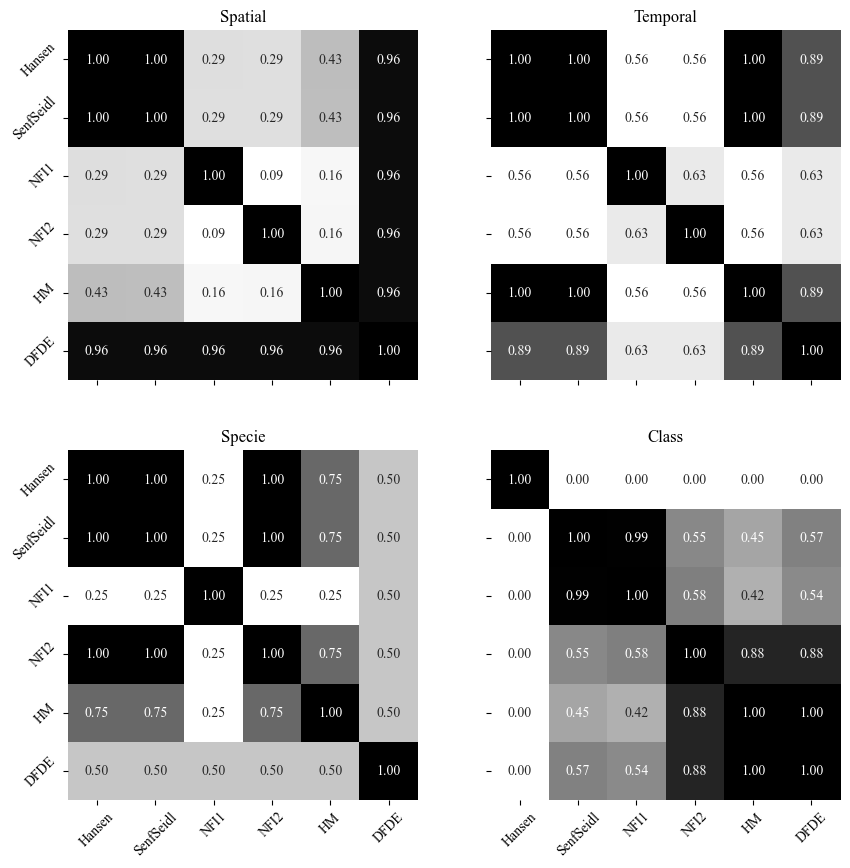

In [48]:


import seaborn as sns
import matplotlib.pyplot as plt
#change font to Times New Roman
plt.rcParams["font.family"] = "Times New Roman"
data = df
similarity_matrix, matrices = compute_similarity_matrix(data, attribution.dtypes_, attribution.dalpha, {'tree specie relatedness': (compute_tree_coherence, {}, 1.0), 'class relatedness': (compute_class_similarity, {'dclass_score': dclass_score}, 1.0)})
fig, axes = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

dname = {
    'spatial': 'Spatial',
    'temporal': 'Temporal',
    'tree specie relatedness': 'Specie',
    'class relatedness': 'Class'
}

#set the colormap for each matrix, the figure is for an article so we use a colorblind friendly colormap, I want cmap that start form white
#use another cmap than Greys
dcmap = {
    'spatial': 'Greys',
    'temporal': 'Greys',
    'tree specie relatedness': 'Greys',
    'class relatedness': 'Greys'
}



axes_ = [ (0,0), (0,1), (1,0), (1,1) ]

for ax, (name, matrices) in zip(axes_, matrices.items()):
    axes[ax].set_title(dname[name])
    sns.heatmap(matrices, annot=True, cmap='Greys', square=True, ax=axes[ax], cbar=False, fmt='.2f')

#set xticks and yticks as the dataset name with 45° rotation
for ax in axes_:
    axes[ax].set_xticklabels(data.Name, rotation=45)
    axes[ax].set_yticklabels(data.Name, rotation=45)




In [49]:
fig.savefig('../figures/similarity_matrix.png', dpi=250, bbox_inches='tight')

In [53]:
data['index_reference'] = 730
get_cluster(data,  {'tree specie relatedness': (compute_tree_coherence, {}, 1.0), 'class relatedness': (compute_class_similarity, {'dclass_score': dclass_score}, 1.0)}, attribution.dtypes_, attribution.dalpha, threshold=0.)

,Similarity,Class,Start_Date,End_Date,index_reference
1,0.556715,biotic-dieback,2012-01-01,2017-12-31,730
0,0.276224,anthropogenic,2010-01-01,2015-12-31,730


<Axes: >

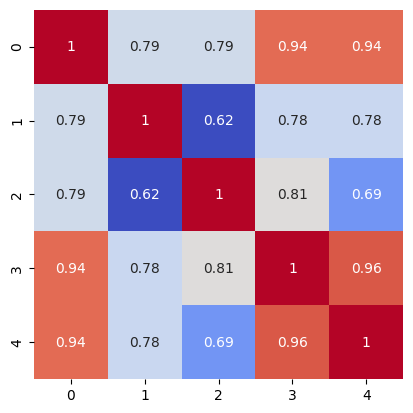

In [314]:
sns.heatmap(similarity_matrix, annot=True, cmap='coolwarm', square=True, cbar=False)

In [310]:
try:
    data['start_date'] = data['start_date'].dt.strftime('%Y-%m-%d')
except :
    pass 

try:
    data['end_date'] = data['end_date'].dt.strftime('%Y-%m-%d')
except : 
    pass

data.explore(column = 'dataset', 
             tooltip = ['year', 'start_date', 'end_date', 'essence', 'class', 'notes', 'labels'], 
             tiles = 'Esri.WorldImagery',
             marker_kwds=dict(radius=5, fill=True))